##### Energy spectra in 3D in time

In [1]:
import os
import sys
import gc
import math as m
import numpy as np
import scipy
import pandas as pd
import pylab
from scipy import *
from scipy.signal import butter, filtfilt, hilbert
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from matplotlib import pyplot as plt
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)
sys.path.append('/projects/DEIKE/cmartinb/jupyter_notebook/project_specific/turbulence')
sys.path.append('/projects/DEIKE/cmartinb/functions')
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from mpl_toolkits.axes_grid1 import make_axes_locatable
from prepare import load_object, save_object, field
from defs import Case, Interface2D
from phase import extract_phase
from funciones import * 
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pylab
import numpy as np
from scipy.signal import find_peaks
from scipy import stats
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

from branches import * 
import matplotlib.tri as mtri
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import scipy.interpolate
os.chdir('/projects/DEIKE/cmartinb/')

In [2]:
params = {'legend.fontsize': 'x-Large',
          'figure.figsize': (15, 6),
         'axes.labelsize': 30,
         'axes.titlesize':30,
         'xtick.labelsize':30,
         'ytick.labelsize':30,
    'font.family': 'STIXGeneral', 
    'axes.titleweight': 'normal',
    'axes.labelweight': 'normal',
    'text.usetex': True, # Enable LaTeX rendering
}

plt.rcParams.update(params)
pylab.rcParams.update(params)

In [3]:
# DEFINE CASE SO WE CAN AUTHOMATIZE IT 
kpHs = '0p3' # 0p16 
dt = '0p2'
uoc = '0p50' # 0p50 0p75
kp = '0p157'
reW = '2.5e4' #1.0e5
g = '9p8'
'''
reA = 720
#maxLevel = 10
maxLevel = 10
Bo=200

if reW == '1.0e5':
    Re_water = 1 * 10**5
else:
    Re_water = 2.5 * 10**4


N = 1024

u = 0.25
lambdap = 2*m.pi/kp

rho1 = 1
rho2 = 1.25*10**(-3)

L0 = 2*np.pi;

ak,  c, omegap, nu_water, g, uoc_val, sigma, Tp= calculate_parameters(kpHs, uoc , u ,kp, Bo, rho1, rho2)
print('ak is', ak, 'c is' ,c, 'w_p$ is', omegap, '$\nu_w$ is' , nu_water, 'g is' ,g, 'N', N)
'''

"\nreA = 720\n#maxLevel = 10\nmaxLevel = 10\nBo=200\n\nif reW == '1.0e5':\n    Re_water = 1 * 10**5\nelse:\n    Re_water = 2.5 * 10**4\n\n\nN = 1024\n\nu = 0.25\nlambdap = 2*m.pi/kp\n\nrho1 = 1\nrho2 = 1.25*10**(-3)\n\nL0 = 2*np.pi;\n\nak,  c, omegap, nu_water, g, uoc_val, sigma, Tp= calculate_parameters(kpHs, uoc , u ,kp, Bo, rho1, rho2)\nprint('ak is', ak, 'c is' ,c, 'w_p$ is', omegap, '$\nu_w$ is' , nu_water, 'g is' ,g, 'N', N)\n"

In [4]:
#L0=10*np.pi/kp
#print(L0)

In [5]:
graph_path = f'/projects/DEIKE/cmartinb/notebooks/graphs/rui_kpHs{kpHs}_dt{dt}_kp{kp}_g{g}/3Dspectra/'
if not os.path.exists(graph_path):
    os.makedirs(graph_path)

In [6]:
work_dir = f'/projects/DEIKE/cmartinb/Ruidata/surface_kpHs{kpHs}_dt{dt}_kp{kp}_g{g}/'

In [7]:
import h5py
h5_path = f'/projects/DEIKE/cmartinb/eta/rui_eta_series_kpHs0p3_dt0p2_kp0p157_g9p8.h5'
with h5py.File(h5_path, 'r') as f:
    # Carga todo el array en memoria (igual que np.load)
    eta_series = f['eta'][:]  

print(eta_series.shape)

(1520, 1024, 1024)


In [8]:
t = np.arange(0, eta_series.shape[0], 0.2)
tstart = t[0]
print(t[150], t.shape)

30.0 (7600,)


In [9]:
print(t[200], t.shape)

40.0 (7600,)


In [10]:
print(eta_series.shape[1])
data = eta_series

1024


In [11]:
lambdap = 40
kp = 2*np.pi/lambdap
g = 9.8
omegap = np.sqrt(g*kp)
print(kp, omegap)

0.15707963267948966 1.2407176956338613


0.0


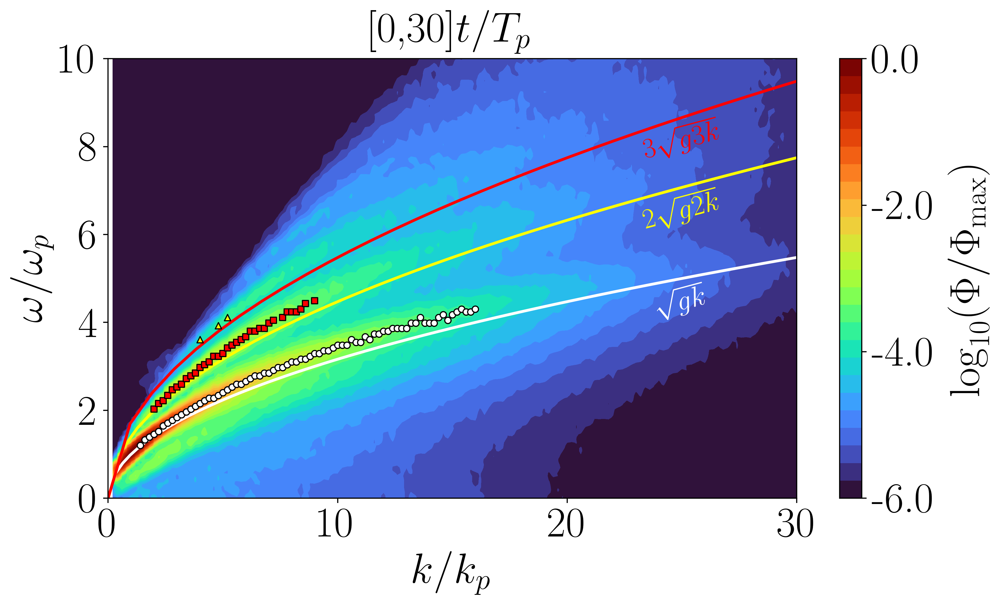

20.0


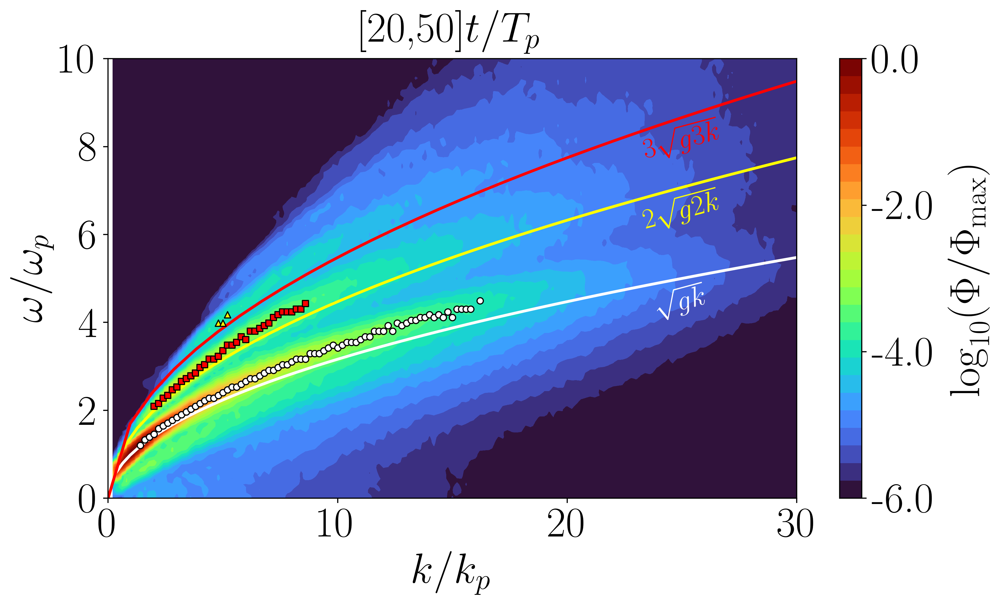

40.0


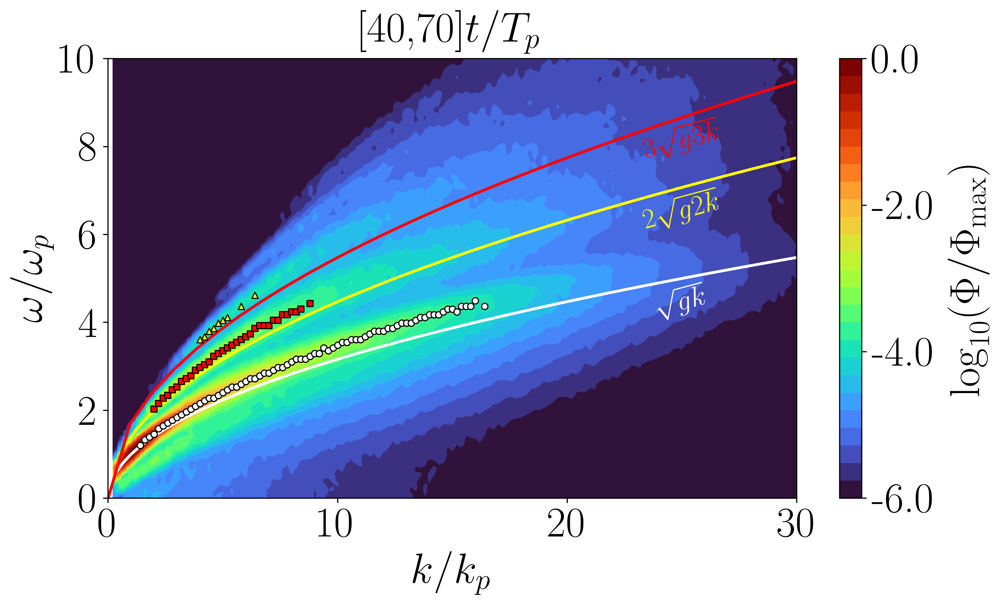

60.0


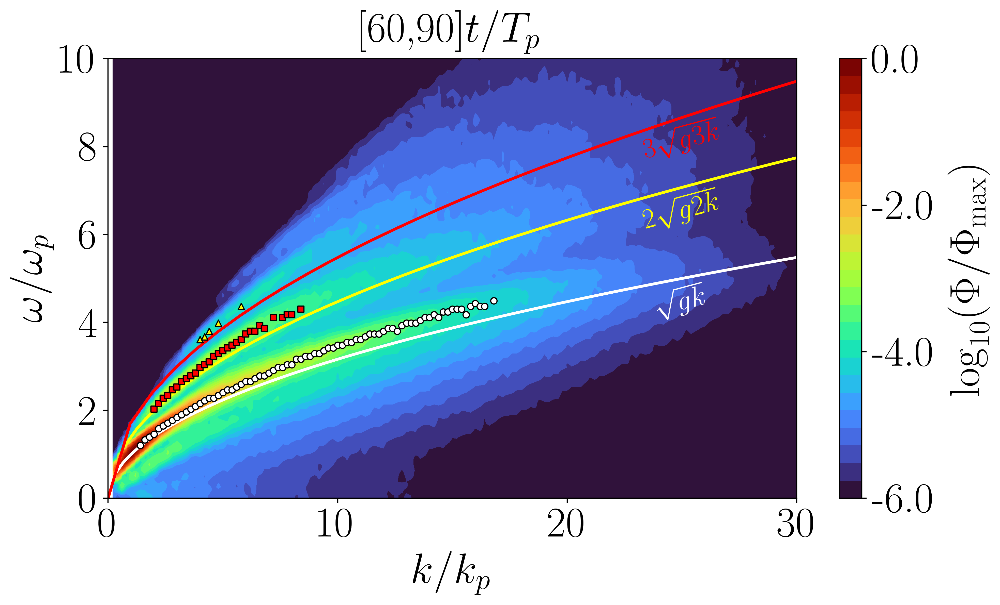

80.0


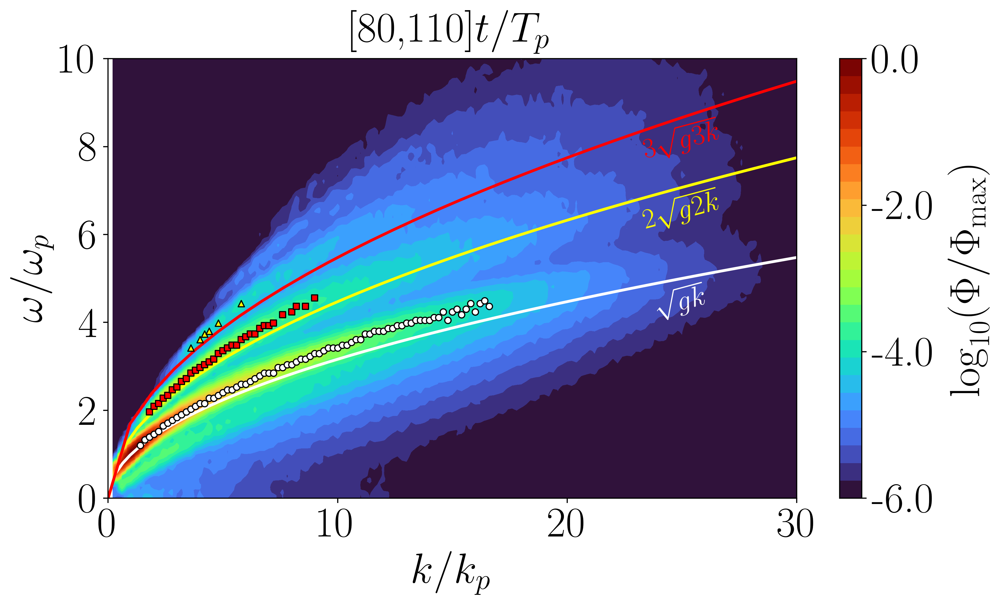

100.0


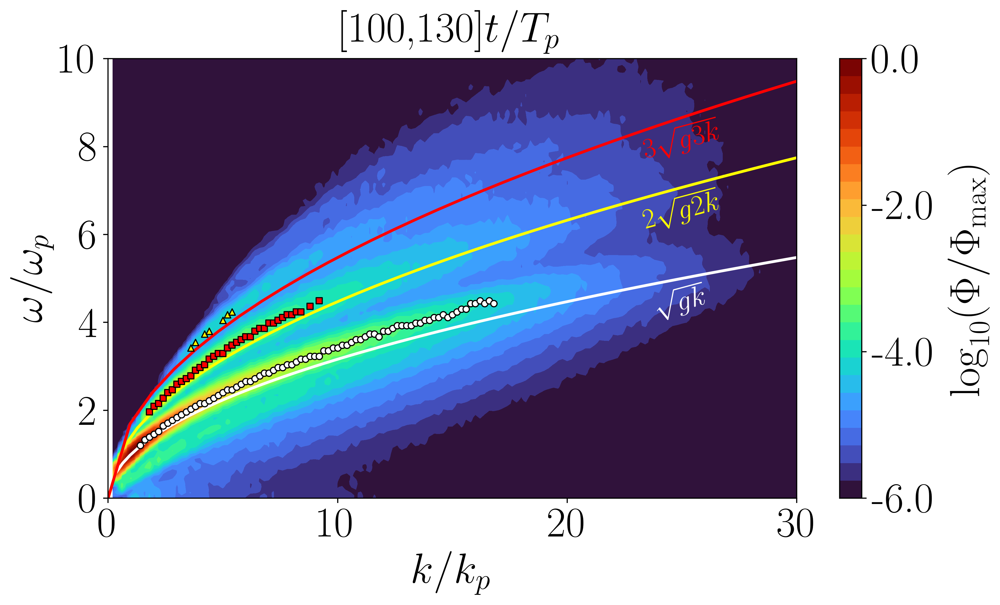

120.0


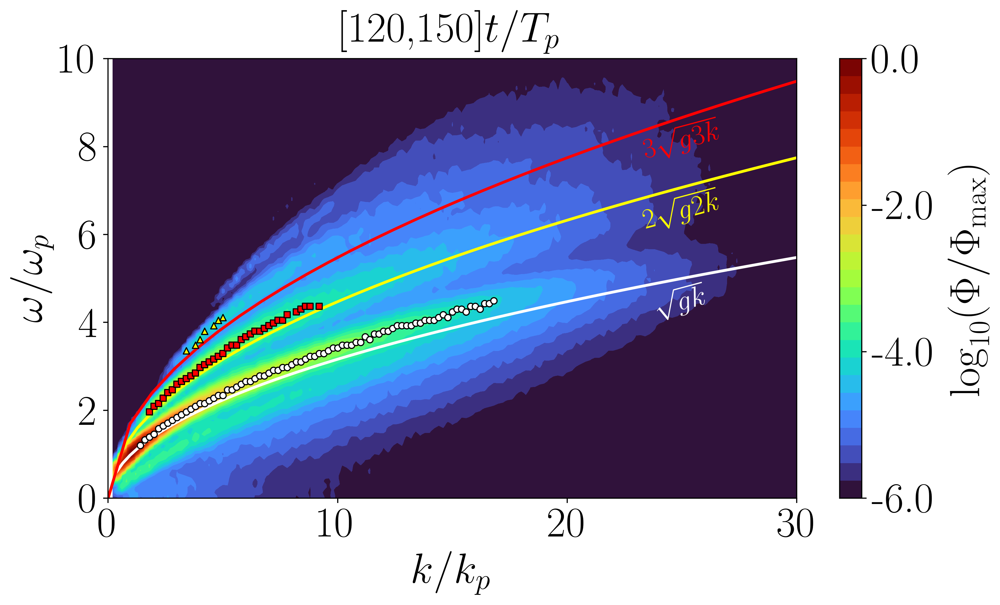

140.0


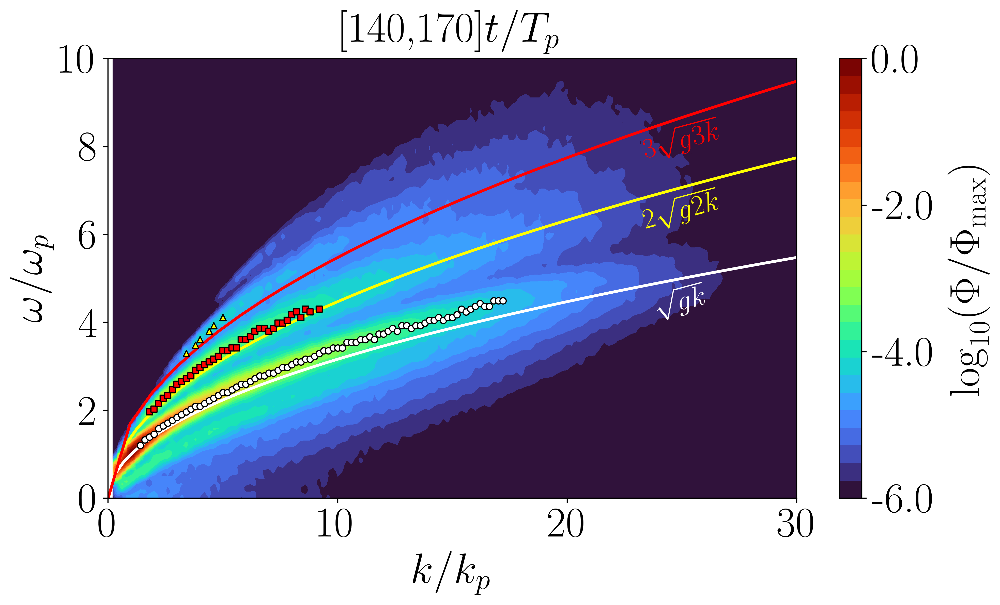

160.0


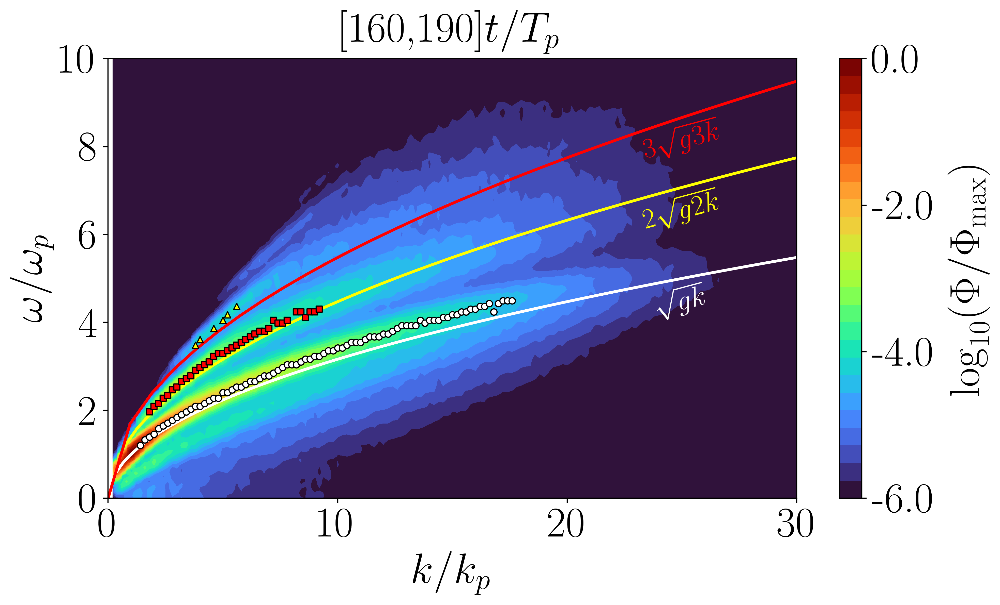

180.0


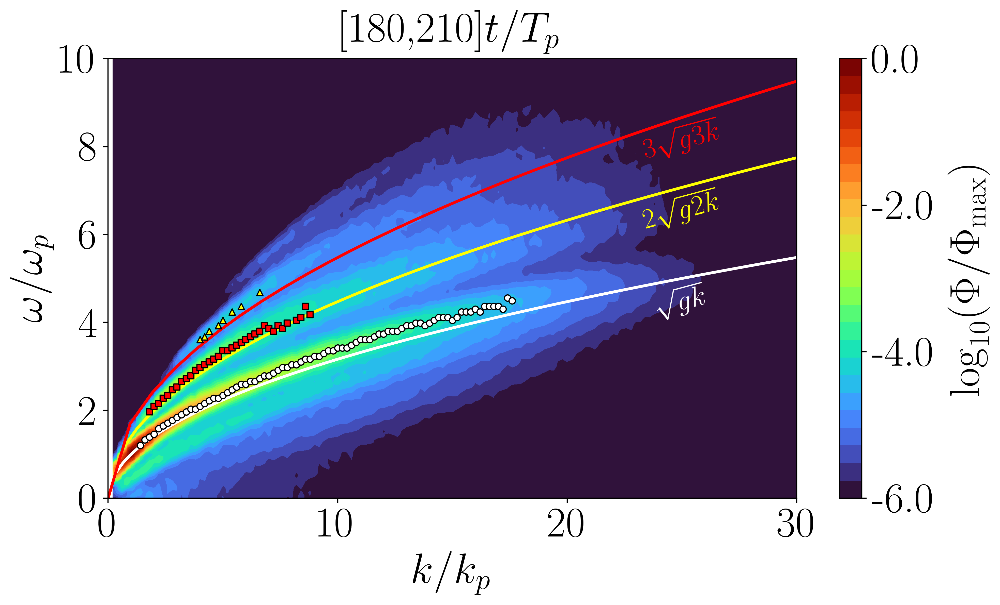

200.0


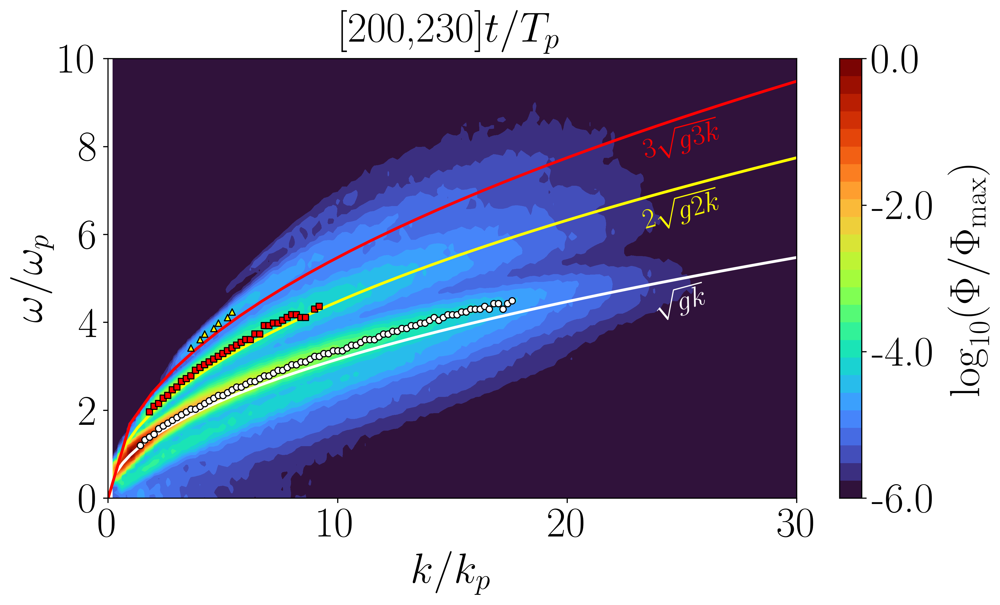

220.0


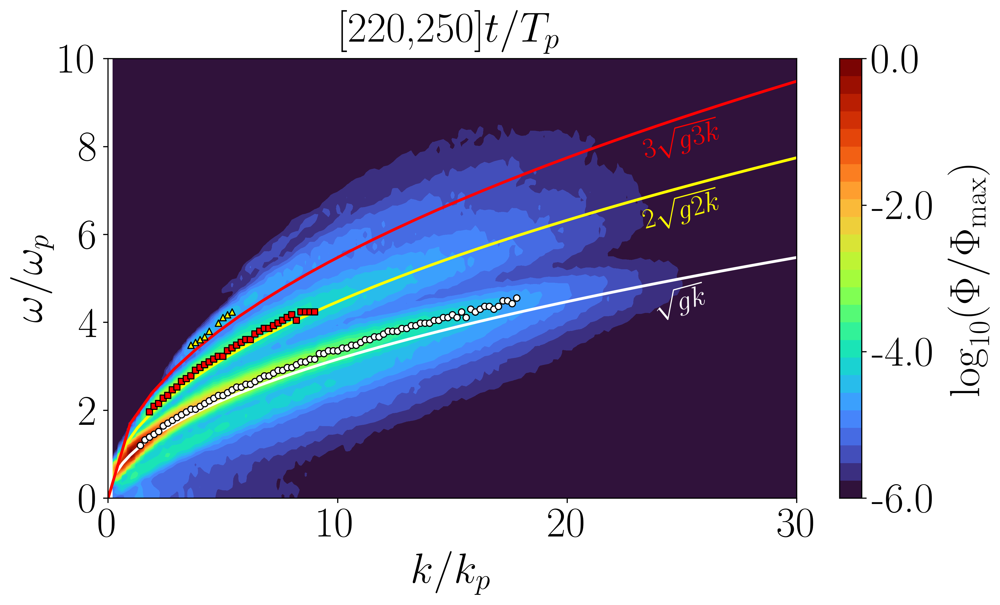

240.0


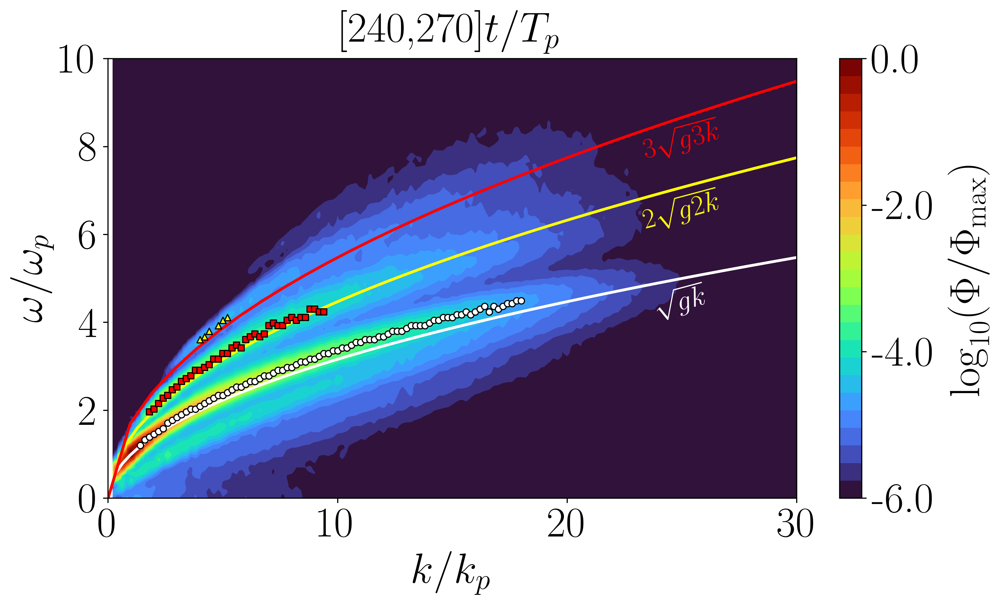

260.0


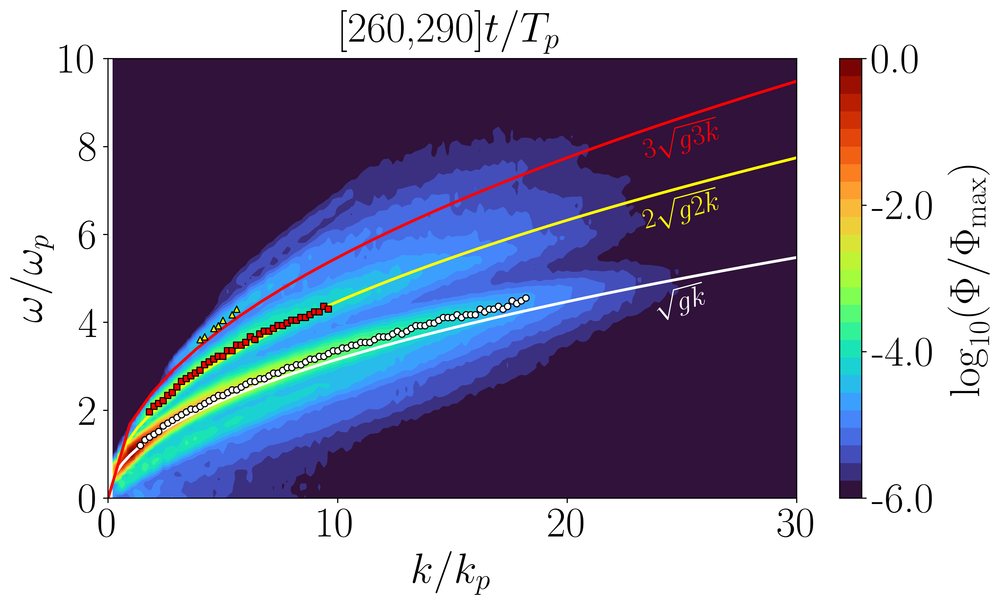

In [12]:
import numpy as np
import h5py
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, LogNorm

# ——————————————————————————————————————
# Parámetros previos (define estos antes):
# h5_path, dt, LN, t (vector de tiempos), g, Bo, rho1, omegap, graph_path…
# ——————————————————————————————————————

dt =0.2
LN = 150

# 1) Marcadores para picos (si más adelante deseas detectar picos)
markers       = ['o', 's', '^']
peak_colors   = ['white', 'red', 'yellow', 'orange']
peak_markers  = ['o', 's', '^', 'd']
height_interval = [-2.5, -2.5, -2.5, -1.5, -1.5, -3, -1.5,
                   -1.5, -1.5, -1.5, -1.5, -1.5, -2, -2,
                   -2, -2, -2, -2, -2, -2, -2]

colors = ['white', 'red', 'yellow', 'orange']
markers = ['o', 's', '^', 'd']

# 2) Dominio normalizado y colormap discreto
vmin, vmax   = 1e-6, 1.0
n_levels     = 25
levels_norm  = np.logspace(np.log10(vmin), 0, n_levels+1)
cmap         = ListedColormap(plt.get_cmap('turbo')(np.linspace(0,1,n_levels)))
norm         = LogNorm(vmin=vmin, vmax=vmax)

# 3) Ticks en log₁₀ (4 valores)
log_min, log_max = np.log10(vmin), 0.0
log_ticks        = np.linspace(log_min, log_max, 4)
ticks            = 10**log_ticks
ticklabels       = [f"{lt:.1f}" for lt in log_ticks]

# 4) Intervalo de confianza con Hann+50% solape
N      = len(t)
L      = LN
step   = L//2
M      = int(np.floor((N - L)/step)) + 1
ENBW   = 1.5
err_frac    = 1.96 * np.sqrt(ENBW/M)
dlog10_CI   = np.log10(1 + err_frac)
ci_height   = dlog10_CI / (log_max - log_min)

h5_path = 'notebooks/spectrum_results.h5'

# Diccionario para almacenar evoluciones
branch_keys = ['first','second','third','fourth']
branches = {k: {'t': [], 'k': [], 'omega': []} for k in branch_keys}


color_fixed = ['deepskyblue','magenta','peru']


with h5py.File(h5_path, 'r') as hf:
    # Cargo vectores completos
    k     = hf['k'][:]        # (n_k,)
    omega = hf['omega'][:]    # (n_omega,)
    subdivs = sorted(hf['subdivisions'].keys(), key=lambda s: int(s))

    k_targets = [4.0, 12.0, 16.0]
    k_indices_to_plot = [np.argmin(np.abs(k - val)) for val in k_targets]
    for name in subdivs:
        start_idx = int(name)
        t0 = start_idx * dt
        print(t0)
        fig, ax = plt.subplots(figsize=(10,6))
        # 5) Carga y enmascara F(k,ω)
        fk2d = hf[f'subdivisions/{name}/F_komega'][:]  # (n_omega, n_k)
        F_full = np.ma.masked_less_equal(fk2d, 0)

        # Normalización en log
        log_F      = np.log(F_full)
        log_F_max  = log_F.max()
        data_norm  = log_F / log_F_max  # va de -∞ a 1

        #--------------- PEAKS ------------------

        k_max_loc = 25#((25 if i < 4 else 6.25) * kp)
        k_min, omega_min =0.1 , np.sqrt(g*kp)
        k_idx = np.where((k>=k_min)&(k<=k_max_loc))[0]
        w_idx = np.where((omega>=omega_min)&(omega<=5*omegap))[0]
    
        sub = np.ma.masked_less_equal(fk2d[np.ix_(w_idx,k_idx)], 0)
        kq = k[k_idx]/kp; wq = omega[w_idx]/omegap

        # Detección mejorada de picos (hasta 4), con prominence
        for col in range(sub.shape[1]):
            col_data = sub[:, col]
            # Si toda la columna es cero o negativa, la saltamos:
            if col_data.max() <= 0:
                continue
        
            curve = np.log(col_data / col_data.max())
            peaks, props = find_peaks(
                curve,
                height=-6,
                distance=3,
                prominence=1.37
            )
        
            for j, p in enumerate(peaks[:3]):
                kv = kq[col]
                wv = wq[p]
                key = branch_keys[j]
                branches[key]['t'].append(t0)
                branches[key]['k'].append(kv)
                branches[key]['omega'].append(wv)
        
                ax.scatter(
                    kv, wv,
                    c=colors[j], marker=markers[j],
                    s=20, edgecolor='k', linewidth=0.8, zorder=5
                )

        
        # Tiempos de inicio y fin
        #start_idx = int(name)
        #t0 = start_idx * dt
        t1 = (start_idx + L) * dt

        # ——— Contourf discreto sobre TODO el rango k×ω
        cf = ax.contourf(
            k/kp, omega/omegap, F_full/np.exp(log_F_max),
            levels=levels_norm, cmap=cmap, norm=norm, extend='both'
        )
        # Líneas guía en k=1,3,4
        #for x,c in zip([1,20,40,60], ['deepskyblue','magenta','springgreen']):
            #ax.axvline(x, linestyle='--', lw=2, color=c, alpha=0.7)

        # Colorbar discreta
        cbar = fig.colorbar(
            cf, ax=ax, ticks=ticks, boundaries=levels_norm,
            spacing='proportional', extendfrac=0
        )
        cbar.set_ticklabels(ticklabels)
        cbar.set_label(r'$\log_{10}(\Phi/\Phi_{\max})$', labelpad=10)

        g = 9.8
        #rho=1000

        k_diss = np.linspace(0, 20, 400)
        dispersion_relation = np.sqrt(k_diss * g)
        #dispersion_relation_tension = np.sqrt(k_diss * g + sigma/rho* k_diss**3)
        
        #dispersion_relation_tension = np.sqrt(k_diss * g + sigma / rho * k_diss**3)
        
        #ax.plot(k_diss / 4, dispersion_relation / omegap, '-', c='black', lw=2, label=r"$\omega= \sqrt{gk}$")
        ax.plot(k_diss/kp, dispersion_relation/omegap , '-', lw=2, c='white', label=r"$\omega= \sqrt{gNk + \sigma/\rho k^3/N}$")
        ax.plot(2*k_diss/kp, 2*dispersion_relation/omegap, '-', lw=2, c='yellow', label=r"$\omega= \sqrt{gNk + \sigma/\rho k^3/N}$")
        ax.plot(3*k_diss/kp, 3*dispersion_relation/omegap, '-', lw=2, c='red', label=r"$\omega= \sqrt{gNk + \sigma/\rho k^3/N}$")
        
        ax.text(
            25,   # x
            4,    # y
            r"$\sqrt{gk}$",
            color='white',
            ha='center', va='bottom',
            rotation=15,
            fontsize=20
        )
        
        ax.text(
            25,
            6,
            r"$2\sqrt{g2k}$",
            color='yellow',
            ha='center', va='bottom',
            rotation=15,
            fontsize=20
        )
        
        ax.text(
            25,
            7.6,
            r"$3\sqrt{g3k}$",
            color='red',
            ha='center', va='bottom',
            rotation=15,
            fontsize=20
        )

                
        ax.set_xlim(0, 30)
        ax.set_ylim(0, 10)
        ax.set_xlabel(r'$k/k_p$')
        ax.set_ylabel(r'$\omega/\omega_p$')
        ax.set_title(f" [{t0:.0f},{t1:.0f}]$t/T_p$", pad = 12)
        

        plt.tight_layout()
        plt.savefig(f"{graph_path}/pcolormesh_fullk_{name}.pdf", dpi=600)
        plt.show()


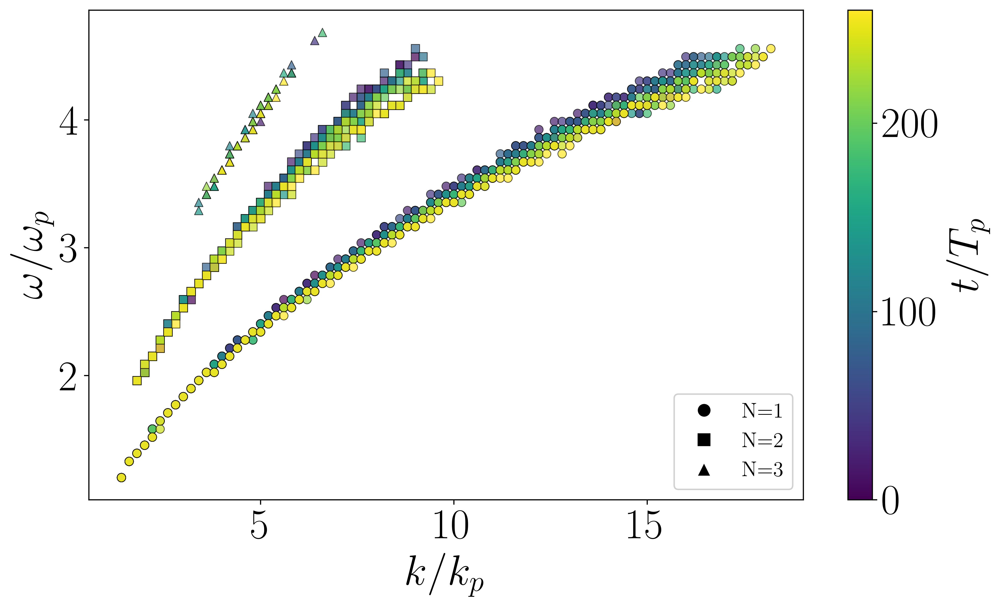

In [13]:
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

dt_max = LN * dt
norm   = Normalize(vmin=0, vmax=t0)
cmap   = plt.get_cmap('viridis')
sm     = ScalarMappable(norm=norm, cmap=cmap)

labels = ['N=1', 'N=2', 'N=3']

fig, ax = plt.subplots(figsize=(10,6))
for key, color, marker in zip(branch_keys, colors, markers):
    t_vals = np.array(branches[key]['t'])
    k_vals = branches[key]['k']
    w_vals = branches[key]['omega']

    sc = ax.scatter(
        k_vals, w_vals,
        c=t_vals,
        cmap=cmap,
        norm=norm,
        marker=marker,
        edgecolor='k',
        linewidth=0.5,
        alpha=0.7,
        label=key
    )

first_legend = ax.legend(
    [plt.Line2D([0], [0], marker=s, color='w', markerfacecolor='black', markersize=10) for s in markers],
    labels,
    loc='lower right',
    fontsize=15,
)
ax.add_artist(first_legend)


ax.set_xlabel(r'$k/k_p$')
ax.set_ylabel(r'$\omega/\omega_p$')

cbar = fig.colorbar(sm, ax=ax)
cbar.set_label(r'$t/T_p$')

#ax.legend(loc='upper left', frameon=True)
plt.tight_layout()
plt.show()

In [14]:
kpHs = '0p3' # 0p16 
dt = '5'
uoc = '0p50' # 0p50 0p75
kp = '0p157'
reW = '2.5e4' #1.0e5
g = '9p8'

In [15]:
work_dir_field = f'/projects/DEIKE/cmartinb/Ruidata/field_kpHs{kpHs}_dt{dt}_kp{kp}_g{g}/'

In [16]:
print(work_dir_field)

/projects/DEIKE/cmartinb/Ruidata/field_kpHs0p3_dt5_kp0p157_g9p8/


In [17]:
def read_velocity(filename, N):
    val = np.fromfile(filename, dtype=np.float32)
    val = val.reshape(N,N)
    return val

In [18]:
N = 1024
val = read_velocity(work_dir_field + 'ux_matrix_t000000000_l00', N)
print(val.shape)

(1024, 1024)


In [19]:
import glob  
import re
pattern = os.path.join(work_dir_field, 'ux_matrix_t*_l*')
files = glob.glob(pattern)

def sort_key(path):
    m = re.search(r't(\d+)_l(\d+)', os.path.basename(path))
    if not m:
        return (0, 0)
    return (int(m.group(1)), int(m.group(2)))

files = sorted(files, key=sort_key)

# Crear el HDF5 de salida
out_h5 = 'ux_all.h5'
with h5py.File(out_h5, 'w') as h5f:
    for fpath in files:
        arr = read_velocity(fpath,N)
        # Usamos el nombre de fichero (sin extensión) como clave
        dset_name = os.path.splitext(os.path.basename(fpath))[0]
        # Compresión gzip nivel 4 (ajustable)
        h5f.create_dataset(
            dset_name,
            data=arr,
            compression='gzip',
            compression_opts=4
        )
print(f"Escrito {len(files)} datasets en {out_h5}")

Escrito 3660 datasets en ux_all.h5


In [20]:

import os, re
import numpy as np
import h5py
import matplotlib.pyplot as plt

# Parámetros multilayer
NL    = 15
ratio = 1.29
dz0   = 1.0
thickness = dz0 * ratio**np.arange(NL)
depths    = np.cumsum(thickness) - 0.5 * thickness  # centro de cada capa
'''
# Ruta de tu HDF5 con subdivs (60 subdivs en total)
#h5_path = '/ruta/a/ux_all.h5'

# 1) Leer y organizar por (t_idx, l_idx_subdiv) -> velocidad media
pattern = re.compile(r'ux_matrix_t(\d+)_l(\d+)')
records = []
with h5py.File(h5_path, 'r') as h5f:
    for key in h5f:
        m = pattern.match(key)
        if not m:
            continue
        t_idx = int(m.group(1))
        l_sub  = int(m.group(2))
        vmean  = h5f[key][:].mean()
        records.append((t_idx, l_sub, vmean))

# Extraer tiempos y número de subdivisiones
times       = sorted({t for t, l, v in records})
n_subdivs   = max(l for t, l, v in records) + 1  # debería ser 60
nt          = len(times)

# Matriz temporal x subdivs
vel_sub = np.zeros((nt, n_subdivs))
time_to_i = {t:i for i, t in enumerate(times)}
for t_idx, l_sub, v in records:
    vel_sub[time_to_i[t_idx], l_sub] = v

# 2) Re-agrupar subdivs → NL capas
subs_per_layer = n_subdivs // NL  # 60/15 = 4
vel_layer = np.zeros((nt, NL))
for L in range(NL):
    cols = slice(L*subs_per_layer, (L+1)*subs_per_layer)
    vel_layer[:, L] = vel_sub[:, cols].mean(axis=1)

# Convertir tiempos físicos si usas dt
dt     = 0.2
t_phys = np.array(times) * dt

# 3) Plot time vs. profundidad
fig, ax = plt.subplots(figsize=(8,6))
im = ax.imshow(
    vel_layer.T,
    aspect='auto',
    origin='lower',
    extent=[t_phys[0], t_phys[-1], depths[-1], depths[0]]
)
cbar = fig.colorbar(im, ax=ax)
cbar.set_label('Velocidad media $u_x$')

ax.set_xlabel('Tiempo (s)')
ax.set_ylabel('Profundidad (en unidades de dz0)')
ax.set_title('Evolución temporal del perfil de velocidad media')

plt.tight_layout()
plt.show()

'''

<>:12: SyntaxWarning: invalid escape sequence '\d'
<>:12: SyntaxWarning: invalid escape sequence '\d'
/tmp/ipykernel_3007851/134157408.py:12: SyntaxWarning: invalid escape sequence '\d'
  '''


"\n# Ruta de tu HDF5 con subdivs (60 subdivs en total)\n#h5_path = '/ruta/a/ux_all.h5'\n\n# 1) Leer y organizar por (t_idx, l_idx_subdiv) -> velocidad media\npattern = re.compile(r'ux_matrix_t(\\d+)_l(\\d+)')\nrecords = []\nwith h5py.File(h5_path, 'r') as h5f:\n    for key in h5f:\n        m = pattern.match(key)\n        if not m:\n            continue\n        t_idx = int(m.group(1))\n        l_sub  = int(m.group(2))\n        vmean  = h5f[key][:].mean()\n        records.append((t_idx, l_sub, vmean))\n\n# Extraer tiempos y número de subdivisiones\ntimes       = sorted({t for t, l, v in records})\nn_subdivs   = max(l for t, l, v in records) + 1  # debería ser 60\nnt          = len(times)\n\n# Matriz temporal x subdivs\nvel_sub = np.zeros((nt, n_subdivs))\ntime_to_i = {t:i for i, t in enumerate(times)}\nfor t_idx, l_sub, v in records:\n    vel_sub[time_to_i[t_idx], l_sub] = v\n\n# 2) Re-agrupar subdivs → NL capas\nsubs_per_layer = n_subdivs // NL  # 60/15 = 4\nvel_layer = np.zeros((nt, N

In [21]:
import re
import h5py

h5_path = 'ux_all.h5'  # Ajusta si está en otra ruta

# 1) Listar todos los datasets y ver sus nombres
print("Datasets en el HDF5:")
with h5py.File(h5_path, 'r') as f:
    def printer(name, obj):
        if isinstance(obj, h5py.Dataset):
            print(" ", name)
    f.visititems(printer)

# 2) Definir un patrón genérico que capture t### y l## al final
#    Usamos '.*' por si están dentro de grupos o con prefijos.
pattern = re.compile(r'.*ux_matrix_t(\d+)_l(\d+)$')

# 3) Recolectar registros (t_idx, l_sub, media)
records = []
with h5py.File(h5_path, 'r') as f:
    def collect(name, obj):
        if not isinstance(obj, h5py.Dataset):
            return
        m = pattern.match(name)
        if m:
            t_idx = int(m.group(1))
            l_sub = int(m.group(2))
            vmean = obj[()].mean()
            records.append((t_idx, l_sub, vmean))
    f.visititems(collect)

print(f"\nRegistros encontrados: {len(records)}")
if not records:
    raise RuntimeError("No se encontró ningún dataset que coincida con el patrón.")

# 4) Ya puedes calcular tiempos y subdivs
times     = sorted({t for t, l, v in records})
n_subdivs = max(l for t, l, v in records) + 1
print(f"Tiempos únicos: {len(times)}, subdivisiones: {n_subdivs}")


Datasets en el HDF5:
  ux_matrix_t000000000_l00
  ux_matrix_t000000000_l01
  ux_matrix_t000000000_l02
  ux_matrix_t000000000_l03
  ux_matrix_t000000000_l04
  ux_matrix_t000000000_l05
  ux_matrix_t000000000_l06
  ux_matrix_t000000000_l07
  ux_matrix_t000000000_l08
  ux_matrix_t000000000_l09
  ux_matrix_t000000000_l10
  ux_matrix_t000000000_l11
  ux_matrix_t000000000_l12
  ux_matrix_t000000000_l13
  ux_matrix_t000000000_l14
  ux_matrix_t000000000_l15
  ux_matrix_t000000000_l16
  ux_matrix_t000000000_l17
  ux_matrix_t000000000_l18
  ux_matrix_t000000000_l19
  ux_matrix_t000000000_l20
  ux_matrix_t000000000_l21
  ux_matrix_t000000000_l22
  ux_matrix_t000000000_l23
  ux_matrix_t000000000_l24
  ux_matrix_t000000000_l25
  ux_matrix_t000000000_l26
  ux_matrix_t000000000_l27
  ux_matrix_t000000000_l28
  ux_matrix_t000000000_l29
  ux_matrix_t000000000_l30
  ux_matrix_t000000000_l31
  ux_matrix_t000000000_l32
  ux_matrix_t000000000_l33
  ux_matrix_t000000000_l34
  ux_matrix_t000000000_l35
  ux_ma

In [22]:
print(kp)

0p157


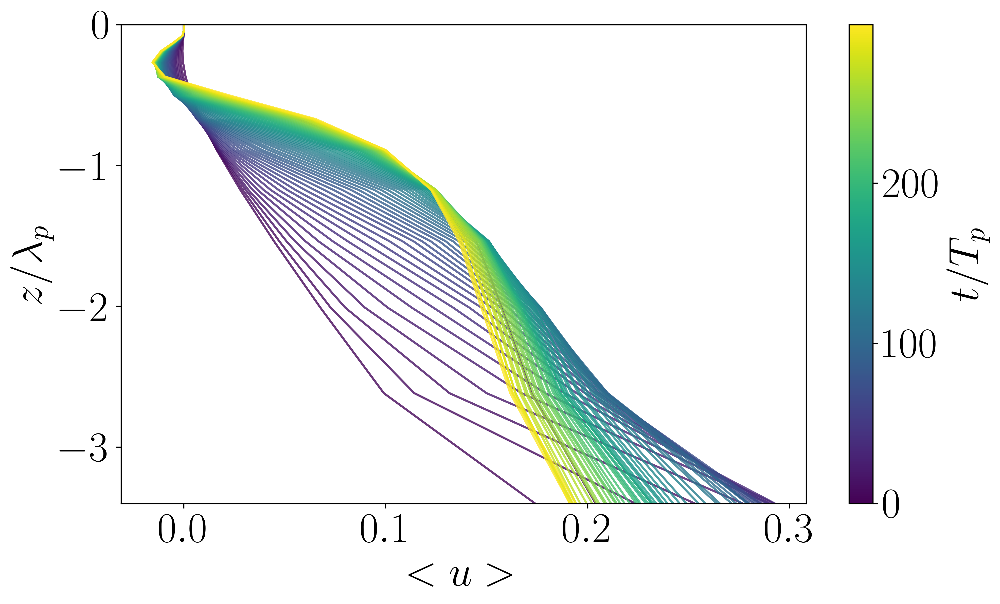

In [23]:
import os
import re
import glob
import numpy as np
import h5py
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# ——————————————————————————————————————
# Parámetros multilayer y simulación
NL    = 15         # número de capas físicas
ratio = 1.29       # razón de progresión geométrica
dz0   = 1.0        # espesor de la capa 0 (arbitrario)
dt    = 0.2        # paso de tiempo
kp=0.157
# ——————————————————————————————————————

# 1) Calcular profundidades de cada capa (centro)
thickness = dz0 * ratio**np.arange(NL)
depths    = np.cumsum(thickness) - 0.5*thickness    # profundidad centro de capa

# 2) Leer todos los ux desde el HDF5 y montar vel_sub[t, l_sub]
h5_path = 'ux_all.h5'
pattern = re.compile(r'.*ux_matrix_t(\d+)_l(\d+)$')

records = []
with h5py.File(h5_path, 'r') as f:
    def collect(name, obj):
        if not isinstance(obj, h5py.Dataset):
            return
        m = pattern.match(name)
        if m:
            t_idx = int(m.group(1))
            l_sub = int(m.group(2))
            vmean = obj[()].mean()
            records.append((t_idx, l_sub, vmean))
    f.visititems(collect)

# ordenar tiempos y determinar número de subdivisiones
times     = sorted({t for t, l, v in records})
n_subdivs = max(l for t, l, v in records) + 1
nt        = len(times)
t_phys    = np.array(times) #* dt

# rellenar vel_sub y reagrupar en vel_layer[t, L]
vel_sub   = np.zeros((nt, n_subdivs))
time_to_i = {t:i for i, t in enumerate(times)}
for t_idx, l_sub, v in records:
    i = time_to_i[t_idx]
    vel_sub[i, l_sub] = v

subs_per_layer = n_subdivs // NL  # 60/15 = 4 subdivs por capa
vel_layer      = np.zeros((nt, NL))
for L in range(NL):
    sl = slice(L*subs_per_layer, (L+1)*subs_per_layer)
    vel_layer[:, L] = vel_sub[:, sl].mean(axis=1)

# 3) Normalizar profundidad por lambda_p para z/λ_p
lambda_p    = 2 * np.pi / kp
depths_norm = -depths / lambda_p   # negativo para que superficie arriba

# 4) Preparar colormap de tiempo
cmap = plt.get_cmap('viridis')
norm = Normalize(vmin=t_phys.min(), vmax=t_phys.max())
sm   = ScalarMappable(norm=norm, cmap=cmap)

# 5) Plot de perfiles u_x(z) coloreados según t
fig, ax = plt.subplots(figsize=(10,6))
for i in range(nt):
    ax.plot(
        vel_layer[i, :],      # velocidad media en cada capa
        depths_norm,          # z/λ_p negativas hacia abajo
        color=cmap(norm(t_phys[i])),
        lw=1.5, alpha=0.8
    )

ax.set_ylim(depths_norm.min(), 0)
ax.set_xlabel(r'$<u>$')
ax.set_ylabel(r'$z/\lambda_p$')

# Colorbar indicando tiempo
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label(r'$t/T_{p}$')

plt.tight_layout()
plt.show()




1.0


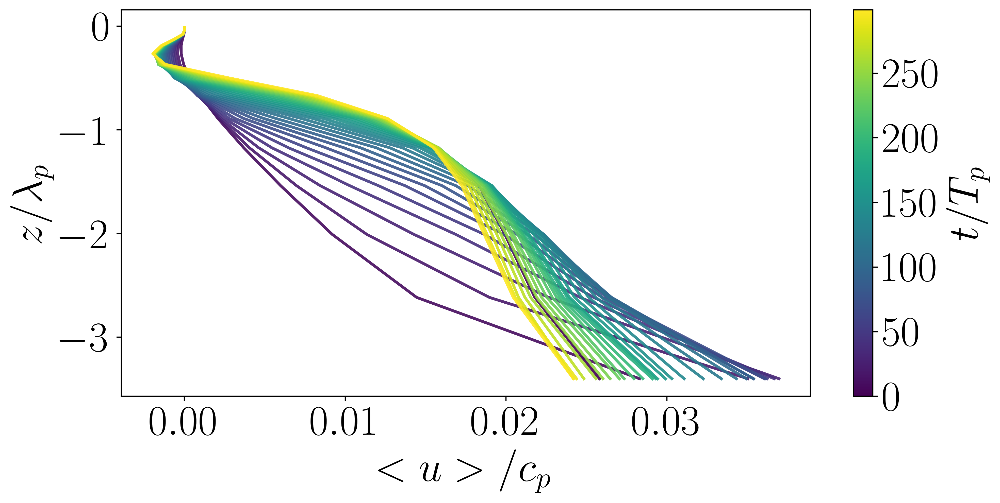

In [24]:
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

cmap = plt.get_cmap('viridis')
norm = Normalize(vmin=t_phys.min(), vmax=t_phys.max())
print(vmax)
sm   = ScalarMappable(norm=norm, cmap=cmap)

cp = omegap/kp

fig, ax = plt.subplots(figsize=(10,5))
for i in range(0,len(t_phys),2):
    ax.plot(vel_layer[i]/cp, depths_norm, color=cmap(norm(t_phys[i])), lw=2, alpha=0.9)

#ax.set_ylim(depths_norm.min(), 0)
ax.set_xlabel(r'$<u>/c_p$')
ax.set_ylabel(r'$z/\lambda_p$')
#ax.set_ylim([-0.1,0])


ticks = list(np.linspace(t_phys.min(), 300, 7))  # por ejemplo 0,50,100,…,300
cbar = fig.colorbar(sm, ax=ax, ticks=ticks)
cbar.set_label(r'$t/T_{p}$')

# Opcional: si quieres labels enteros
cbar.set_ticklabels([f"{int(t)}" for t in ticks])
plt.tight_layout()
plt.show()


In [26]:
'''
from matplotlib.collections import LineCollection

dt_max = LN * dt
norm   = Normalize(vmin=0, vmax=t0)
cmap   = plt.get_cmap('viridis')
sm     = ScalarMappable(norm=norm, cmap=cmap)
kp=0.157


labels = ['N=1', 'N=2', 'N=3']

fig, ax = plt.subplots(figsize=(10,6))
jj=0
for key, color, marker in zip(branch_keys, colors, markers):
    t_vals = np.array(branches[key]['t'])
    k_vals = np.array(branches[key]['k'], dtype=float)
    w_vals = np.array(branches[key]['omega'], dtype=float)

    sc = ax.scatter(
        k_vals, w_vals,
        c=t_vals,
        cmap=cmap,
        norm=norm,
        marker=marker,
        edgecolor='k',
        linewidth=0.5,
        alpha=0.7,
        label=key
    )

    ux_avg_i = np.array(vel_layer[i, :])  # Perfil de velocidad en el intervalo actual
    phi_avg_i = np.array(depths_norm)  # Perfil de profundidad en el intervalo actual

    k_vals= np.array(k_vals)

    integral_num = []
    h = 1

    for (ki,omegai) in zip(k_vals,w_vals):
        #h_val = 1
        integrand_values = (ux_avg_i) * np.exp(2* ki * kp * phi_avg_i)
        doppler_shift_speed = kp * ki * np.trapz(integrand_values, phi_avg_i)
        integral_num.append(doppler_shift_speed)
    if t_vals.size == 0:
        continue
    #print( np.abs(np.array(integral_num)))
    omega_nl = (np.sqrt(g * (kp * k_vals) ) + 2 * np.abs(np.array(integral_num)) * (kp * k_vals)) / omegap #+ sigma * (kp * k_vals)**3)+
    pts  = np.vstack([k_vals, omega_nl]).T.reshape(-1,1,2)
    segs = np.concatenate([pts[:-1], pts[1:]], axis=1) 
    #ax.plot(k_vals, omega_nl, '--', color=col, linewidth=2, alpha=0.6 )
    lc = LineCollection(segs,
                        cmap=cmap,
                        norm=norm,
                        linestyles='--',
                        linewidth=2,
                        alpha=0.6)
    # 3) asigno el array de tiempos para colorear cada segmento
    lc.set_array(t_vals)
    # 4) la añado al eje
    ax.add_collection(lc)
    jj +=1 

first_legend = ax.legend(
    [plt.Line2D([0], [0], marker=s, color='w', markerfacecolor='black', markersize=10) for s in markers],
    labels,
    loc='lower right',
    fontsize=15,
)
ax.add_artist(first_legend)

ax.plot(k_diss/kp, dispersion_relation/omegap , '-', lw=2, c='grey', label=r"$\omega= \sqrt{gNk + \sigma/\rho k^3/N}$")
ax.plot(2*k_diss/kp, 2*dispersion_relation/omegap, '-', lw=2, c='grey', label=r"$\omega= \sqrt{gNk + \sigma/\rho k^3/N}$")
ax.plot(3*k_diss/kp, 3*dispersion_relation/omegap, '-', lw=2, c='grey', label=r"$\omega= \sqrt{gNk + \sigma/\rho k^3/N}$")
ax.set_xlabel(r'$k/k_p$')
ax.set_ylabel(r'$\omega/\omega_p$')

ax.set_xlim([0,20])
ax.set_ylim([0,6])


cbar = fig.colorbar(sm, ax=ax)
cbar.set_label(r'$t/T_p$')

#ax.legend(loc='upper left', frameon=True)
plt.tight_layout()
plt.show()
'''

<>:1: SyntaxWarning: invalid escape sequence '\o'
<>:1: SyntaxWarning: invalid escape sequence '\o'
/tmp/ipykernel_3007851/1573917065.py:1: SyntaxWarning: invalid escape sequence '\o'
  '''


'\nfrom matplotlib.collections import LineCollection\n\ndt_max = LN * dt\nnorm   = Normalize(vmin=0, vmax=t0)\ncmap   = plt.get_cmap(\'viridis\')\nsm     = ScalarMappable(norm=norm, cmap=cmap)\nkp=0.157\n\n\nlabels = [\'N=1\', \'N=2\', \'N=3\']\n\nfig, ax = plt.subplots(figsize=(10,6))\njj=0\nfor key, color, marker in zip(branch_keys, colors, markers):\n    t_vals = np.array(branches[key][\'t\'])\n    k_vals = np.array(branches[key][\'k\'], dtype=float)\n    w_vals = np.array(branches[key][\'omega\'], dtype=float)\n\n    sc = ax.scatter(\n        k_vals, w_vals,\n        c=t_vals,\n        cmap=cmap,\n        norm=norm,\n        marker=marker,\n        edgecolor=\'k\',\n        linewidth=0.5,\n        alpha=0.7,\n        label=key\n    )\n\n    ux_avg_i = np.array(vel_layer[i, :])  # Perfil de velocidad en el intervalo actual\n    phi_avg_i = np.array(depths_norm)  # Perfil de profundidad en el intervalo actual\n\n    k_vals= np.array(k_vals)\n\n    integral_num = []\n    h = 1\n\n    

In [27]:
print(t_phys.max())

299


In [28]:
'''
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

cmap = plt.get_cmap('viridis')
norm = Normalize(vmin=t_phys.min(), vmax=t_phys.max())
print(vmax)
sm   = ScalarMappable(norm=norm, cmap=cmap)

fig, ax = plt.subplots(figsize=(10,5))
i =0
for key, color, marker in zip(branch_keys, colors, markers):
    t_vals = np.array(branches[key]['t'])
    k_vals = np.array(branches[key]['k'], dtype=float)
    w_vals = np.array(branches[key]['omega'], dtype=float)
    integral_num = []
    nn = min(len(t_vals), len(vel_layer))
    #for i in range(nn):
    vel_i = vel_layer[i]
    for (ki,omegai) in zip(k_vals,w_vals):
        integrand_values = (ux_avg_i) * np.exp(2* ki * kp * phi_avg_i)
        doppler_shift_speed = kp * ki * np.trapz(integrand_values, phi_avg_i)
        integral_num.append(doppler_shift_speed)
    ax.plot(k_vals, integral_num, color=cmap(norm([i])), lw=2, alpha=0.9)
    i+=1

#ax.set_ylim(depths_norm.min(), 0)
ax.set_xlabel(r'$<u>$')
ax.set_ylabel(r'$z/\lambda_p$')
#ax.set_ylim([-0.1,0])


ticks = list(np.linspace(t_phys.min(), 300, 7))  # por ejemplo 0,50,100,…,300
cbar = fig.colorbar(sm, ax=ax, ticks=ticks)
cbar.set_label(r'$t/T_{p}$')

# Opcional: si quieres labels enteros
cbar.set_ticklabels([f"{int(t)}" for t in ticks])
plt.tight_layout()
plt.show()
'''

<>:1: SyntaxWarning: invalid escape sequence '\l'
<>:1: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_3007851/3566222232.py:1: SyntaxWarning: invalid escape sequence '\l'
  '''


'\nfrom matplotlib.colors import Normalize\nfrom matplotlib.cm import ScalarMappable\n\ncmap = plt.get_cmap(\'viridis\')\nnorm = Normalize(vmin=t_phys.min(), vmax=t_phys.max())\nprint(vmax)\nsm   = ScalarMappable(norm=norm, cmap=cmap)\n\nfig, ax = plt.subplots(figsize=(10,5))\ni =0\nfor key, color, marker in zip(branch_keys, colors, markers):\n    t_vals = np.array(branches[key][\'t\'])\n    k_vals = np.array(branches[key][\'k\'], dtype=float)\n    w_vals = np.array(branches[key][\'omega\'], dtype=float)\n    integral_num = []\n    nn = min(len(t_vals), len(vel_layer))\n    #for i in range(nn):\n    vel_i = vel_layer[i]\n    for (ki,omegai) in zip(k_vals,w_vals):\n        integrand_values = (ux_avg_i) * np.exp(2* ki * kp * phi_avg_i)\n        doppler_shift_speed = kp * ki * np.trapz(integrand_values, phi_avg_i)\n        integral_num.append(doppler_shift_speed)\n    ax.plot(k_vals, integral_num, color=cmap(norm([i])), lw=2, alpha=0.9)\n    i+=1\n\n#ax.set_ylim(depths_norm.min(), 0)\nax.

In [29]:
'''
fig, ax = plt.subplots(figsize=(8,5))

for key in branch_keys:
    t_vals = np.array(branches[key]['t'], dtype=float)
    if t_vals.size == 0:
        print(f"Saltar “{key}”: no hay tiempos")
        continue

    # <— Aquí reasignamos k_vals por rama, como hiciste al principio: 
    k_vals = np.array(branches[key]['k'], dtype=float)
    print(f"Rama {key}: len(t_vals)={len(t_vals)}, len(k_vals)={len(k_vals)}")

    for t_i, u_L_i in zip(t_vals, vel_layer):
        # integrales vectorizadas en k:
        u_eff = []
        for k in k_vals:
            I = np.trapz(u_L_i * np.exp(2*k*z_nd), z_nd)
            u_eff.append(2*k*I)

        ax.scatter(k_vals, u_eff,
                color=cmap(norm(t_i)),
                alpha=0.8)

# Dibujamos ejes y colorbar
ax.set_xlabel(r'$k$')
ax.set_ylabel(r'$u_{\rm eff}(k)$')
fig.colorbar(sm, ax=ax, label=r'$t/T_p$')
plt.tight_layout()
plt.show()
'''

'\nfig, ax = plt.subplots(figsize=(8,5))\n\nfor key in branch_keys:\n    t_vals = np.array(branches[key][\'t\'], dtype=float)\n    if t_vals.size == 0:\n        print(f"Saltar “{key}”: no hay tiempos")\n        continue\n\n    # <— Aquí reasignamos k_vals por rama, como hiciste al principio: \n    k_vals = np.array(branches[key][\'k\'], dtype=float)\n    print(f"Rama {key}: len(t_vals)={len(t_vals)}, len(k_vals)={len(k_vals)}")\n\n    for t_i, u_L_i in zip(t_vals, vel_layer):\n        # integrales vectorizadas en k:\n        u_eff = []\n        for k in k_vals:\n            I = np.trapz(u_L_i * np.exp(2*k*z_nd), z_nd)\n            u_eff.append(2*k*I)\n\n        ax.scatter(k_vals, u_eff,\n                color=cmap(norm(t_i)),\n                alpha=0.8)\n\n# Dibujamos ejes y colorbar\nax.set_xlabel(r\'$k$\')\nax.set_ylabel(r\'$u_{\rm eff}(k)$\')\nfig.colorbar(sm, ax=ax, label=r\'$t/T_p$\')\nplt.tight_layout()\nplt.show()\n'

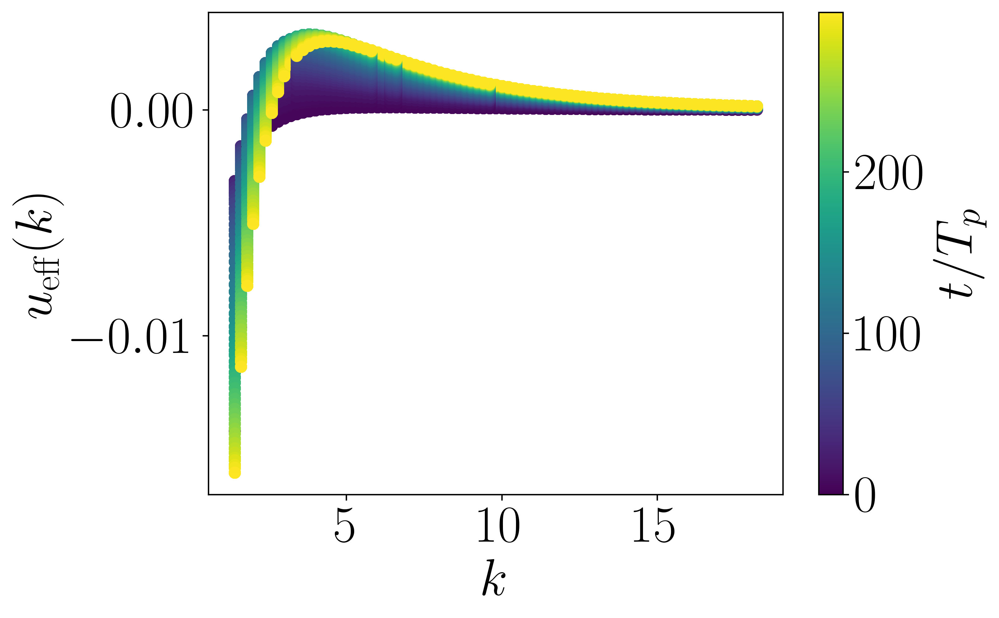

In [30]:
# 1) Creamos el colormap una vez para todos los tiempos
cmap = plt.get_cmap('viridis')
norm = Normalize(vmin=t_phys.min(), vmax=t_phys.max())
sm   = ScalarMappable(norm=norm, cmap=cmap)
z_nd   = depths_norm           # tu eje z/λ_p, shape (nz,)
vel_L  = vel_layer 
fig, ax = plt.subplots(figsize=(8,5))

# 2) Bucle por cada rama, pero coloreamos siempre con t_phys
for key in branch_keys:
    # saltamos ramas vacías
    t_vals = np.array(branches[key]['t'], float)
    if t_vals.size == 0:
        continue

    # k_vals sí depende de la rama
    k_vals = np.array(branches[key]['k'], float)

    # 3) Iteramos SOBRE t_phys y vel_layer, no sobre t_vals
    for t_i, u_L_i in zip(t_phys, vel_L):
        # calculamos u_eff(k) para esa rama pero con tu perfil actual u_L_i
        u_eff = [2*k*np.trapz(u_L_i * np.exp(2*k*z_nd), z_nd)
                 for k in k_vals]
        ax.scatter(k_vals, u_eff,
                color=cmap(norm(t_i)),
                 alpha=0.8)

# 4) Ejes y barra de color
ax.set_xlabel(r'$k$')
ax.set_ylabel(r'$u_{\rm eff}(k)$')
fig.colorbar(sm, ax=ax, label=r'$t/T_p$')
plt.tight_layout()
plt.show()

/tmp/ipykernel_3007851/2937790596.py:40: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(k_vals, u_eff,


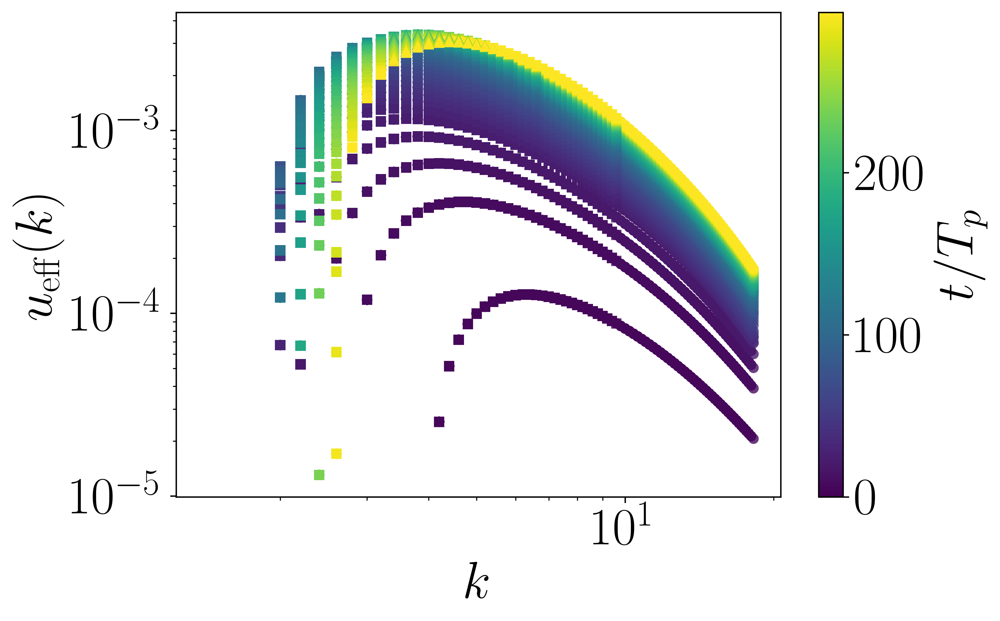

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# 1) Creamos el colormap una vez para todos los tiempos
cmap = plt.get_cmap('viridis')
norm = Normalize(vmin=t_phys.min(), vmax=t_phys.max())
sm   = ScalarMappable(norm=norm, cmap=cmap)

z_nd  = depths_norm   # eje z/λ_p, shape (nz,)
vel_L = vel_layer     # shape (nt, nz)

# marcadores por rama: first→círculo, second→cuadrado, third→triángulo
markers = {
    'first':  'o',
    'second': 's',
    'third':  '^'
}

fig, ax = plt.subplots(figsize=(8,5))

# 2) Bucle por cada rama, pero coloreamos siempre con t_phys y usamos su marker
for key in branch_keys:
    # saltamos ramas vacías
    t_vals = np.array(branches[key]['t'], float)
    if t_vals.size == 0:
        continue

    # k_vals sí depende de la rama
    k_vals = np.array(branches[key]['k'], float)

    # elegimos marcador (si no está en el dict, usamos circulito por defecto)
    m = markers.get(key, 'o')

    # 3) Iteramos SOBRE t_phys y vel_L
    for t_i, u_L_i in zip(t_phys, vel_L):
        u_eff = [2*k*np.trapz(u_L_i * np.exp(2*k*z_nd), z_nd)
                 for k in k_vals]
        ax.scatter(k_vals, u_eff,
                   c=cmap(norm(t_i)),
                   marker=m,
                   alpha=0.8,
                   edgecolor='none')  # quita el borde para más claridad

# 4) Ejes y barra de color
ax.set_xlabel(r'$k$')
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_ylabel(r'$u_{\rm eff}(k)$')
fig.colorbar(sm, ax=ax, label=r'$t/T_p$')
plt.tight_layout()
plt.show()


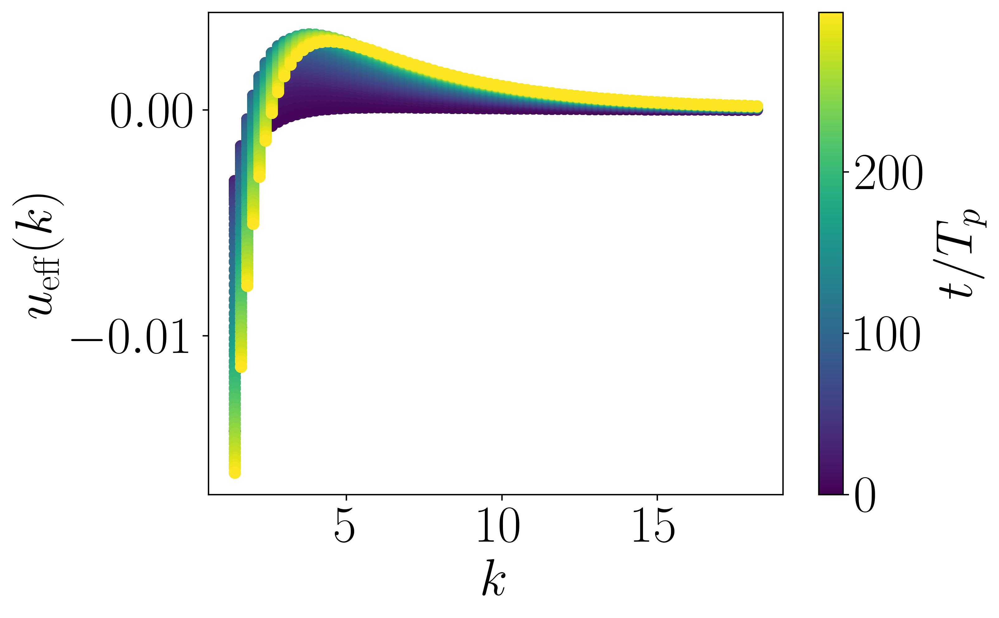

In [32]:
# normalizamos el colormap al rango de t_phys
cmap = plt.get_cmap('viridis')
norm = Normalize(vmin=t_phys.min(), vmax=t_phys.max())
sm   = ScalarMappable(norm=norm, cmap=cmap)

fig, ax = plt.subplots(figsize=(8,5))

# extraemos k_vals de la rama first (sólo para fijar los ejes x)
k_vals = np.array(branches['first']['k'], dtype=float)

# recorremos el par (t_phys[i], vel_layer[i]) directamente
for t_i, u_L_i in zip(t_phys, vel_layer):
    u_eff = [2*k*np.trapz(u_L_i * np.exp(2*k*z_nd), z_nd)
             for k in k_vals]
    ax.scatter(k_vals, u_eff,
               color=cmap(norm(t_i)),
               alpha=0.8)

ax.set_xlabel(r'$k$')
ax.set_ylabel(r'$u_{\rm eff}(k)$')
fig.colorbar(sm, ax=ax, label=r'$t/T_p$')
plt.tight_layout()
plt.show()


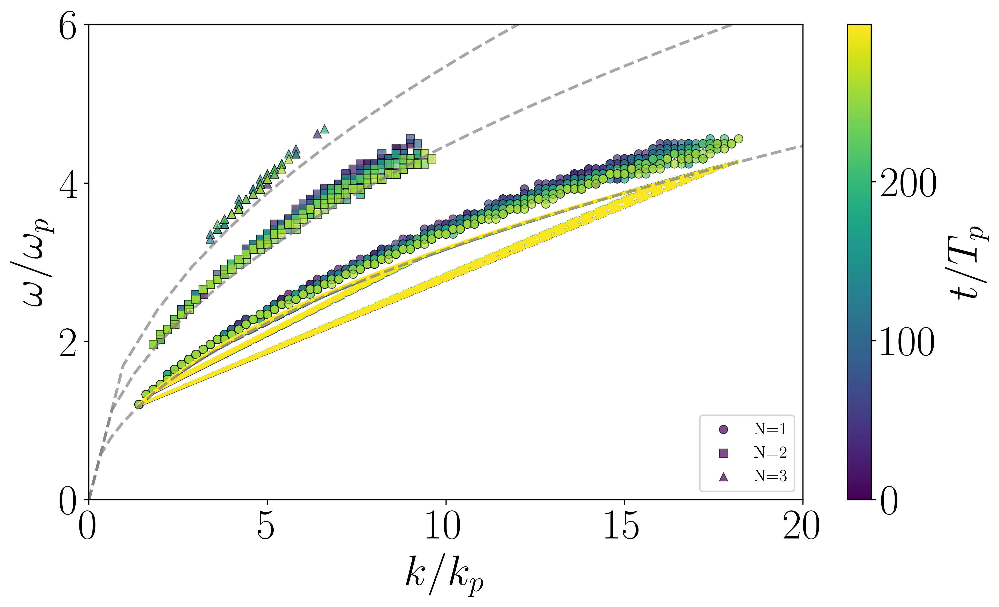

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from matplotlib.collections import LineCollection

# — Parámetros que ya tenías —
dt_max = LN * dt
kp     = 0.157
g      = 9.81

# Colormap global basado en t_phys
cmap = plt.get_cmap('viridis')
norm = Normalize(vmin=t_phys.min(), vmax=t_phys.max())
sm   = ScalarMappable(norm=norm, cmap=cmap)

# Marcadores y etiquetas estáticas por rama
markers = {'first':'o', 'second':'s', 'third':'^'}
labels  = {'first':'N=1',  'second':'N=2','third':'N=3'}

fig, ax = plt.subplots(figsize=(10,6))

for key in ['first','second','third']:
    k_vals = np.array(branches[key]['k'],     float)
    w_vals = np.array(branches[key]['omega'], float)
    t_vals = np.array(branches[key]['t'],     float)

    # escogemos el marcador según la rama:
    m = markers[key]

    sc = ax.scatter(
        k_vals, w_vals,
        c=t_vals,        # colores según tiempo
        cmap=cmap,
        norm=norm,
        marker=m,        # <-- aquí markers[key], no "marker"
        edgecolor='k',
        linewidth=0.5,
        alpha=0.7,
        label=labels[key]
    )

# 2) Sobre cada rama, trazamos las curvas no lineales coloreadas por t_phys
for key in ['first','second','third']:
    k_vals = np.array(branches[key]['k'], dtype=float)
    phi_nd = depths_norm  # z/λ_p negativo o positivo según tu convención

    for i, t_i in enumerate(t_phys):
        ux = vel_layer[i, :]   # perfil de velocidad a ese tiempo

        # calculamos la integral para cada k
        integral_num = [
            kp * ki * np.trapz( ux * np.exp( 2 * ki * kp * phi_nd ),
                               phi_nd )
            for ki in k_vals
        ]
        # pulsación no lineal: lineal + corrección Doppler
        omega_nl = ( np.sqrt(g * (kp * k_vals))
                    + 2 * np.abs(integral_num) * (kp * k_vals)
                   ) / omegap

        # construimos los segmentos para LineCollection
        pts  = np.vstack([k_vals, omega_nl]).T.reshape(-1,1,2)
        segs = np.concatenate([pts[:-1], pts[1:]], axis=1)

        lc = LineCollection(segs,
                            cmap=cmap, norm=norm,
                            linestyles='--',
                            linewidth=2,
                            alpha=0.6)
        # colorear TODO el tramo con el scalar t_i
        lc.set_array(np.full(len(segs), t_i))
        ax.add_collection(lc)

# 3) Añadimos las curvas de dispersión lineal multiescala
for N, color in zip([1,2,3], ['grey','grey','grey']):
    ax.plot((N*k_diss)/kp,
            (N*dispersion_relation)/omegap,
            '--', lw=2, c=color,alpha=0.7)

# 4) Leyenda de marcadores y colorbar
legend1 = ax.legend(loc='lower right', fontsize=12)
cbar    = fig.colorbar(sm, ax=ax, label=r'$t/T_p$')

ax.set_xlabel(r'$k/k_p$')
ax.set_ylabel(r'$\omega/\omega_p$')
ax.set_xlim(0,20)
ax.set_ylim(0,6)
plt.tight_layout()
plt.show()